In [1]:
%load_ext autoreload
%autoreload 2

In [17]:
import numpy as np
import plotly.express as ex
import plotly.graph_objects as go
import pandas as pd

from numpy import exp

from tracking.motion import ConstantVelocityModel, constant_velocity_models
from tracking.target import ConstantAccelerationTarget, ConstantVelocityTarget, SinusTarget, SingerTarget
from tracking.kalman import KalmanFilter6D
from tracking.evaluation import evaluate, monte_carlo, rmse, execute

from tracking.plot import boxplot_rmse, plot_position_errors, aggregated_errors, plot_aggregated_errors, plot_error_band
from tracking.util import to_df

## Constant-Velocity Target

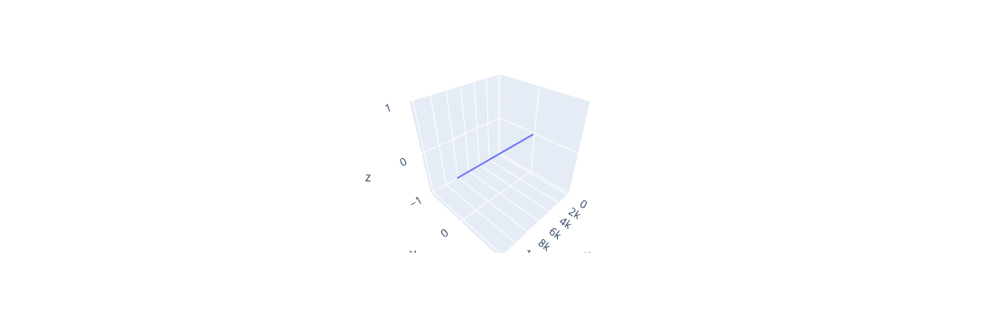

In [3]:
target = ConstantVelocityTarget()

fig = ex.scatter_3d(target.true_states_df(), x='x', y='y', z='z')
fig.update_traces(marker_size = 1)
fig

In [4]:
motion  = constant_velocity_models(.1 ,.5, 1, 2, 5, 10, 20)
z_sigma = [.87, 8.72, 87.2]
results = monte_carlo(target, motion, z_sigma)

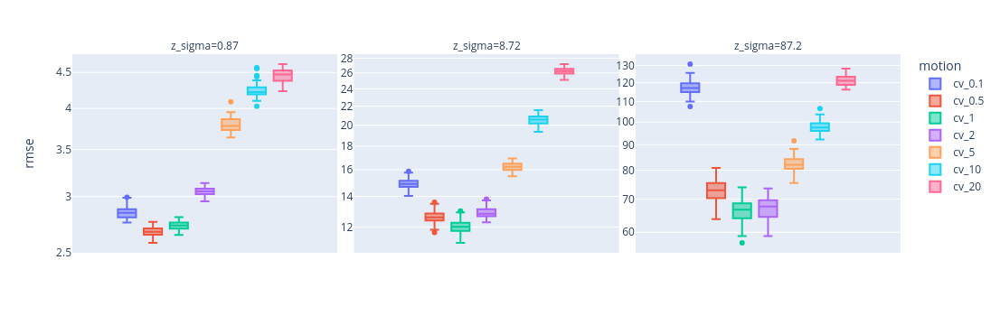

In [5]:
data = rmse(results)

fig=ex.box(data, y='rmse', color='motion', facet_col='z_sigma', log_y=True)
fig.update_xaxes(type='category')
fig.update_yaxes(matches=None, showticklabels=True)
fig

In [6]:
r = results.select(z_sigma=.87)[0]
r

EvaluationResult {'target': 'cv', 'motion': 'cv_0.1', 'z_sigma': 0.87, 'seed': 0, 'R': 0.7569}

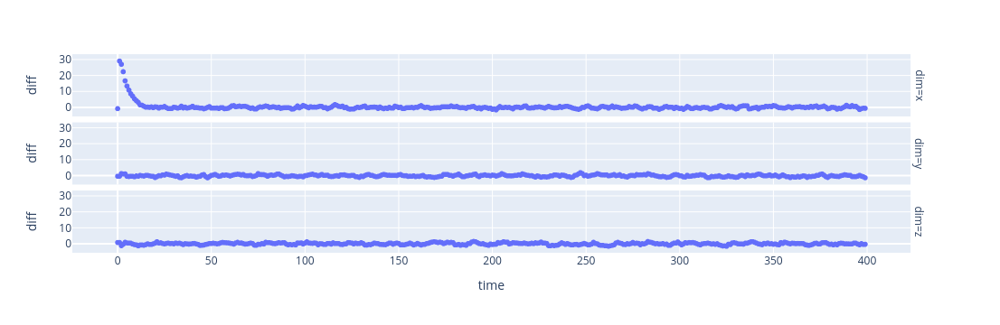

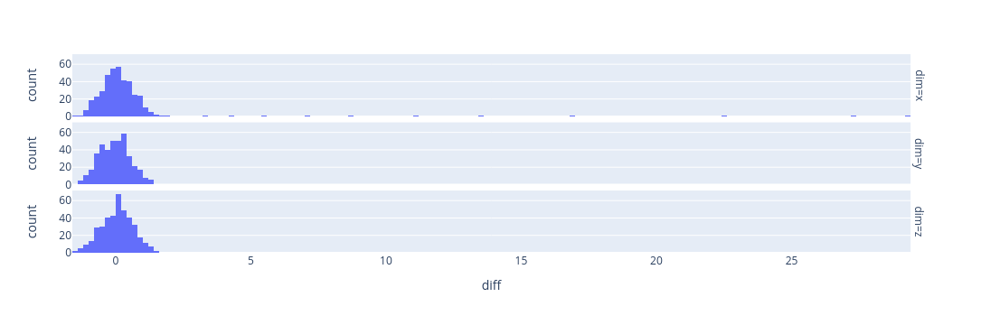

In [7]:
plot_position_errors(r)

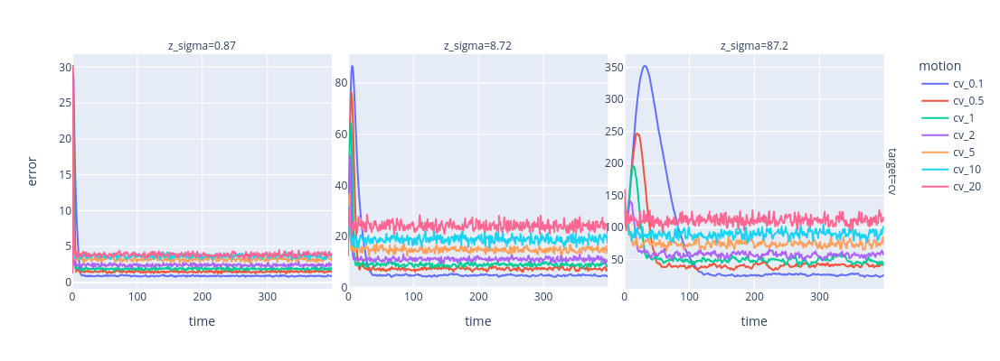

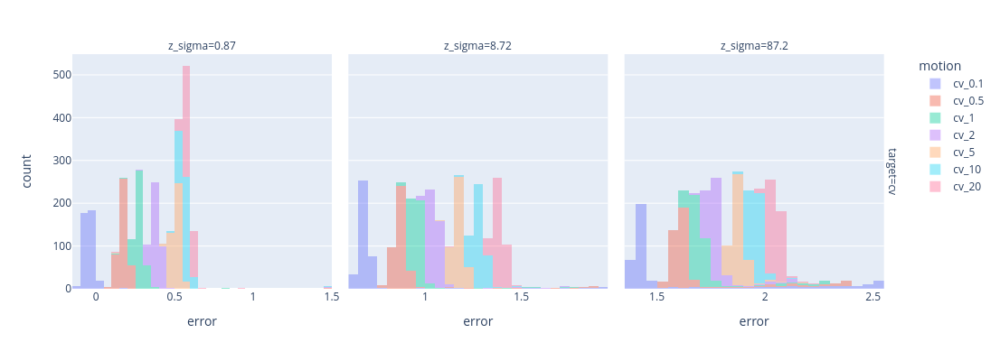

In [8]:
plot_aggregated_errors(results).update_layout(height=400)

## Constant-Acceleration Target

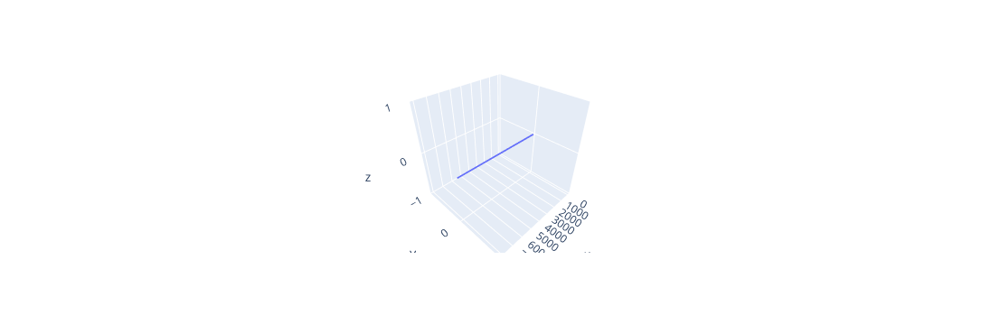

In [9]:
target = ConstantAccelerationTarget()

fig = ex.scatter_3d(target.true_states_df(), x='x', y='y', z='z')
fig.update_traces(marker_size = 1)
fig

In [10]:
targets = [ConstantAccelerationTarget(.1), ConstantAccelerationTarget(.5), ConstantAccelerationTarget(2)]
motion  = constant_velocity_models(.1 ,.5, 1, 2, 5, 10, 20)
z_sigma = [.87, 8.72, 87.2]
results = monte_carlo(targets, motion, z_sigma)

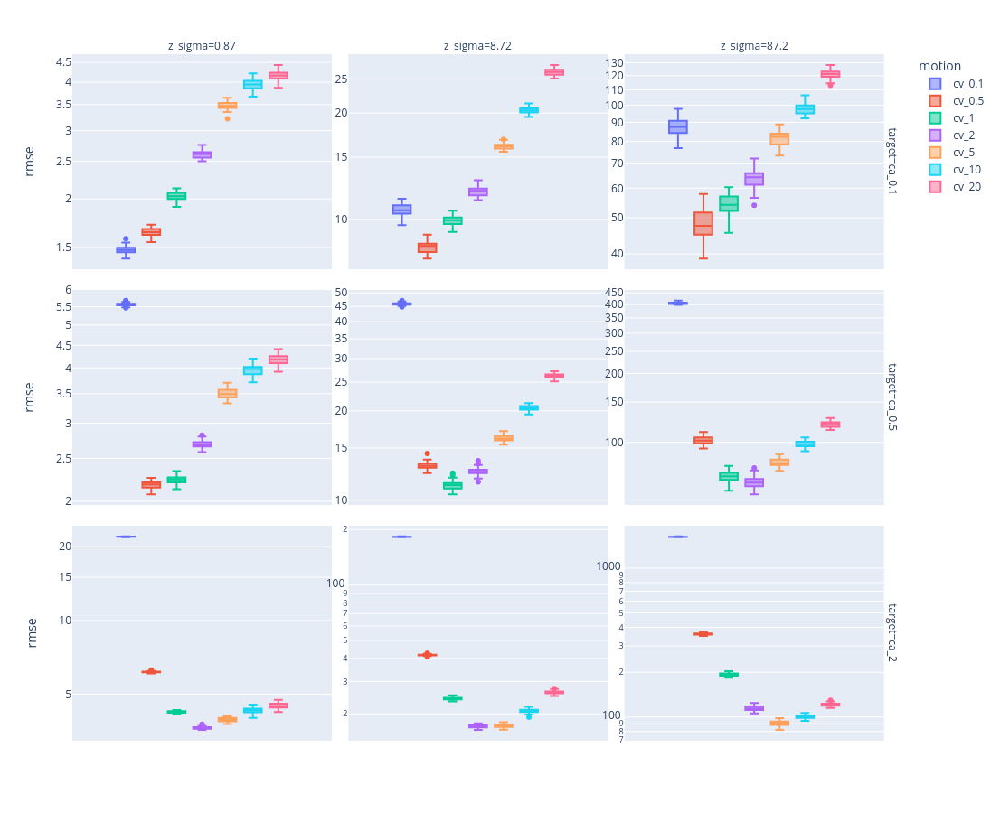

In [11]:
data = rmse(results)

fig=ex.box(data, y='rmse', color='motion', facet_col='z_sigma', facet_row='target', log_y=True)
fig.update_xaxes(type='category')
fig.update_yaxes(matches=None, showticklabels=True)
fig.update_layout(width=1100, height=900)
fig

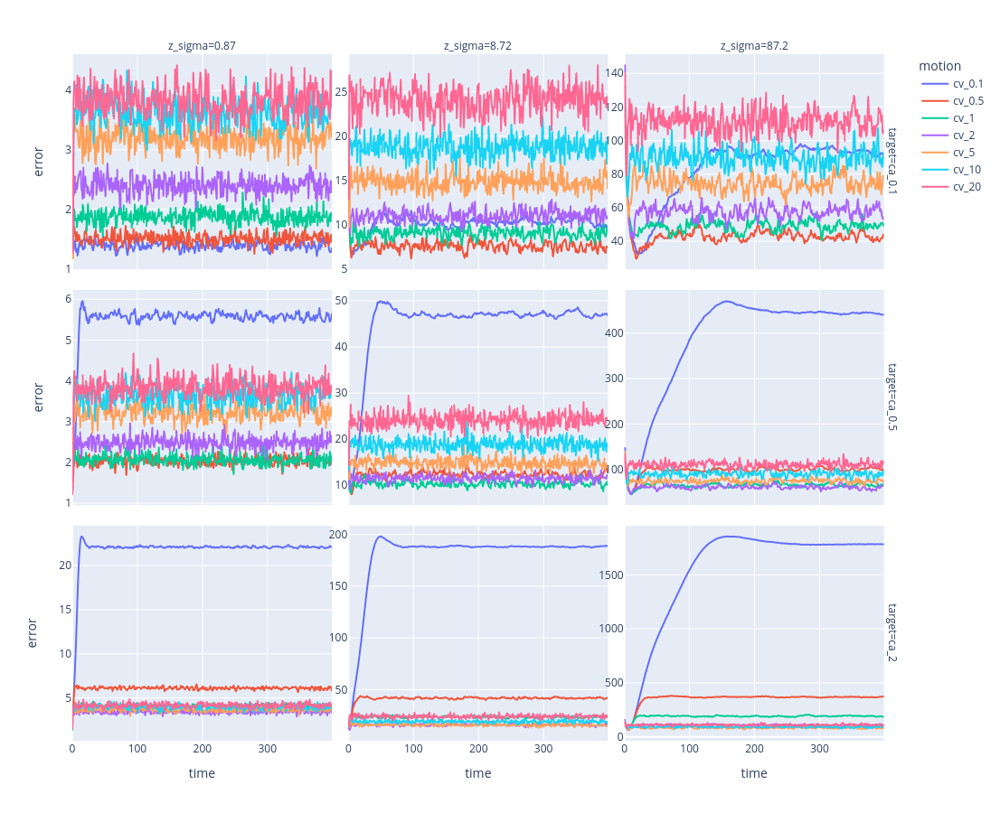

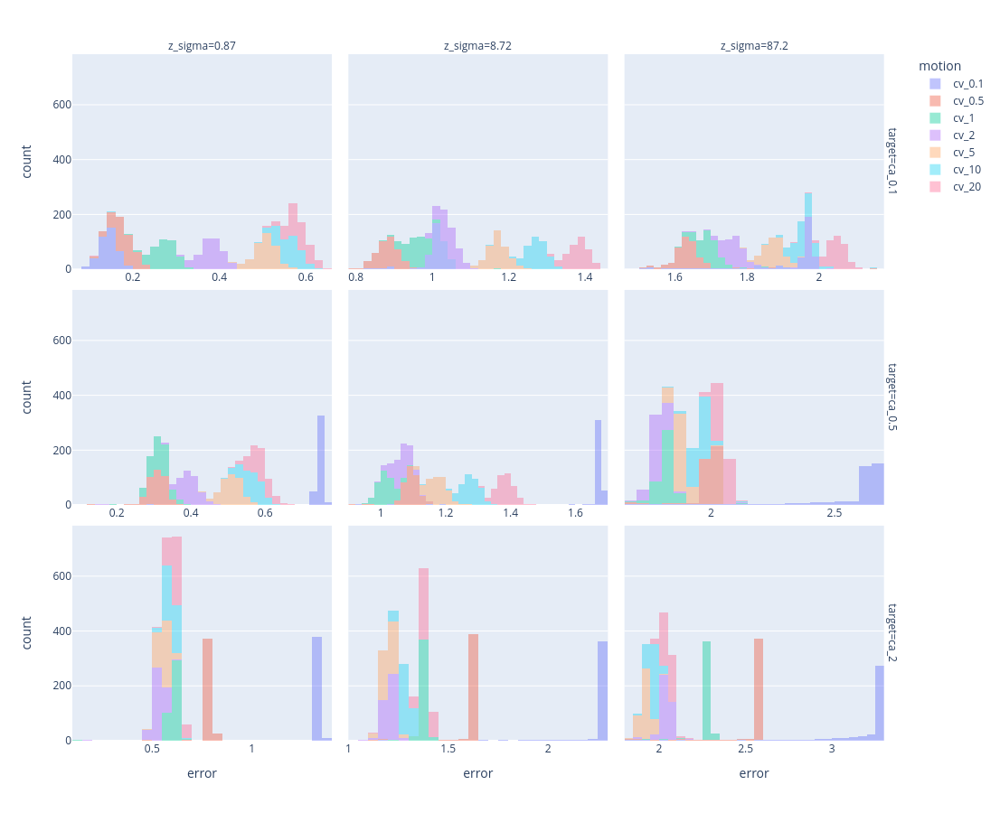

In [12]:
plot_aggregated_errors(results)

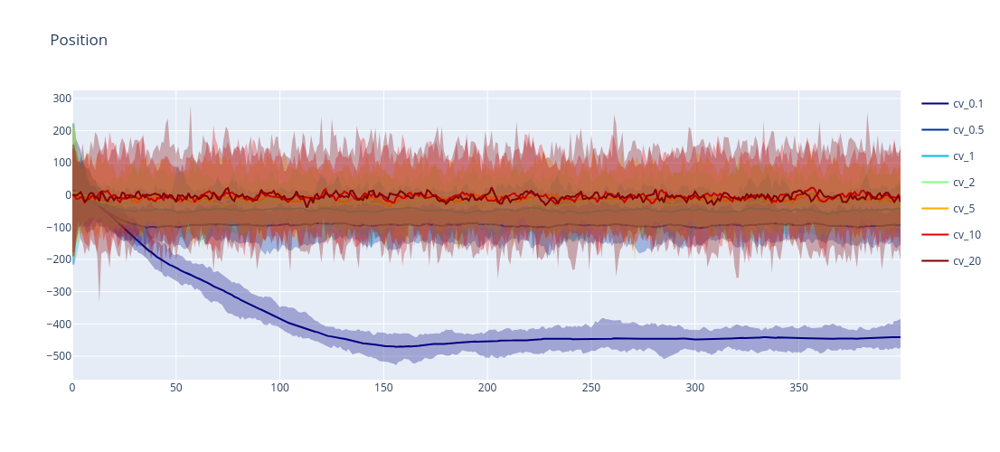

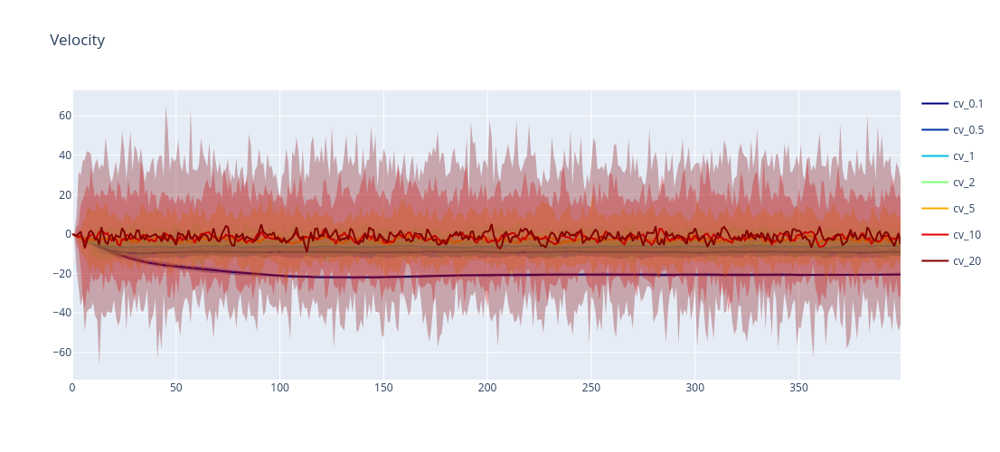

In [14]:
sel = results.select(target='ca_0.5', z_sigma='87.2')
plot_error_band(sel).update_layout(height=500)

In [35]:
x = results[0].truth[:,0]
data = np.array((np.arange(400), results[0].K[:,0,0], results[0].z[:,0]-x, results[0].x_hat[:,0]-x)).T
data = to_df(data, columns=['t', 'K', 'z', 'x_hat'])

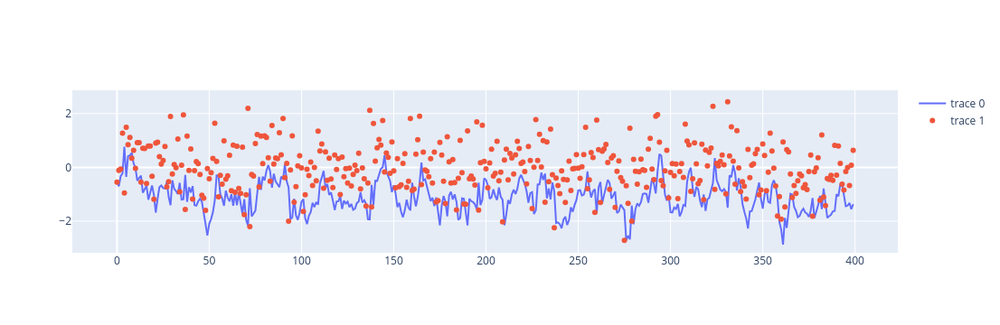

In [39]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=data['t'], y=data['x_hat'], mode='lines'))
fig.add_trace(go.Scatter(x=data['t'], y=data['z'], mode='markers'))
fig

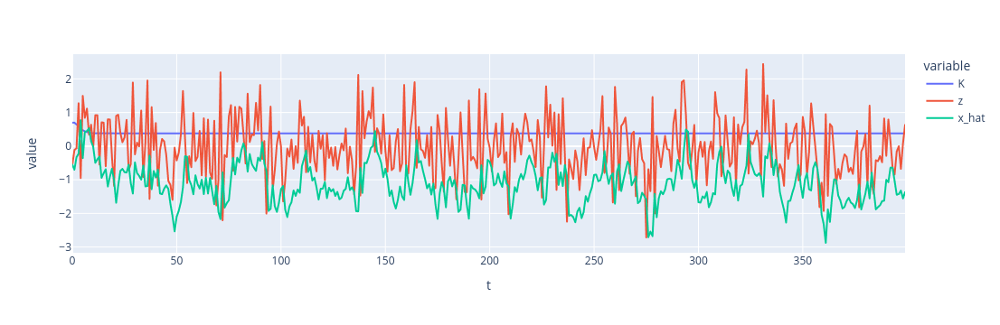

In [40]:
ex.line(data.melt(id_vars=['t']), x='t', y='value', color='variable')

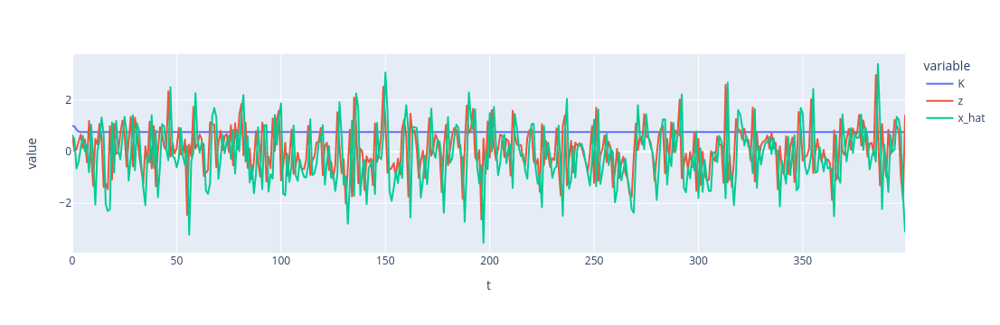

In [48]:
r = execute(results[0].copy(R=.01))

x = r.truth[:,0]
data = np.array((np.arange(400), r.K[:,0,0], r.z[:,0]-x, r.x_hat[:,0]-x)).T
data = to_df(data, columns=['t', 'K', 'z', 'x_hat'])

ex.line(data.melt(id_vars=['t']), x='t', y='value', color='variable')

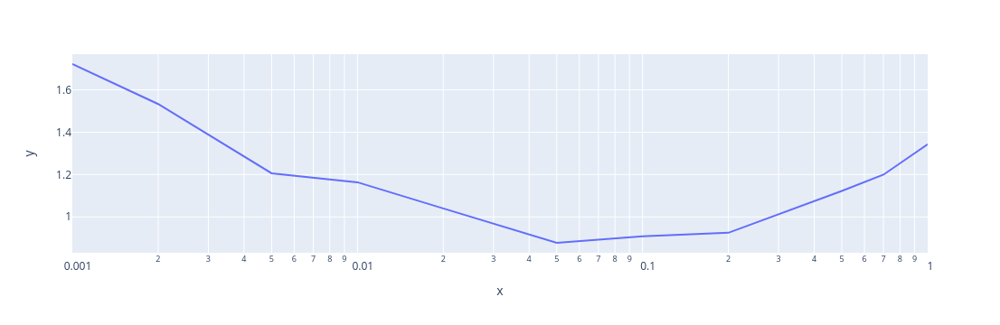

In [53]:
err = []
Rs = [.001, .002, .005, .01, .02, .05, .1, .2, .5, .7, 1]

for R in Rs:
    r = execute(results[0].copy(R=R))
    e = np.sqrt(np.power(np.array(r.x_hat[:,0] - r.truth[:,0]), 2).mean())
    err.append(e)

ex.line(x=Rs, y=err, log_x=True)

In [107]:
a = .5
results = monte_carlo(ConstantAccelerationTarget(a), ConstantVelocityModel(.1), 87.2, seeds=range(500), n=400)

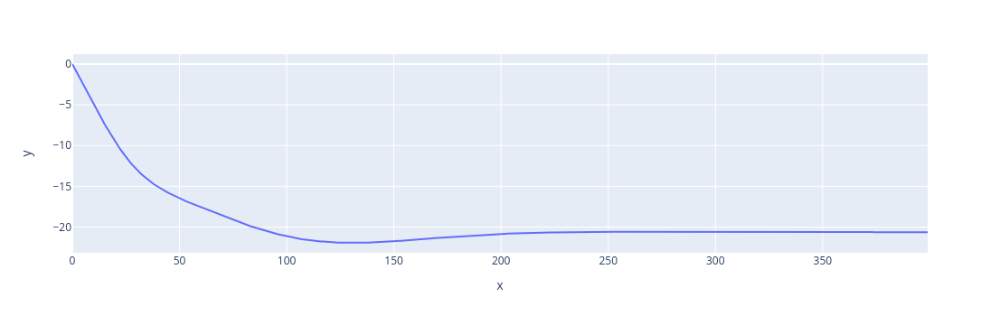

In [108]:
d = np.array([r.x_hat[:,3] - r.truth[:,3] for r in results]).T
ex.line(y=d.mean(axis=1))

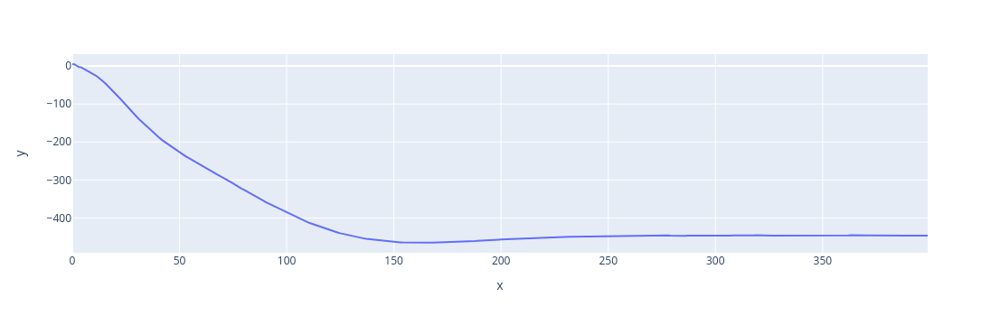

In [109]:
d = np.array([r.x_hat[:,0] - r.truth[:,0] for r in results]).T
ex.line(y=d.mean(axis=1))

In [110]:
Kx = results[0].K[-1,0,0]
Kv = results[0].K[-1,3,0]
Kx, Kv

(0.04676261551988992, 0.0011196545460642083)

In [113]:
# dx, dv
a/Kv, a*((Kx+Kv)/Kv - .5)

(446.5663107943356, 21.132608695811186)

In [154]:
a = .25
results = monte_carlo(ConstantAccelerationTarget(a), ConstantVelocityModel(.5), 1, seeds=range(5000), n=200)

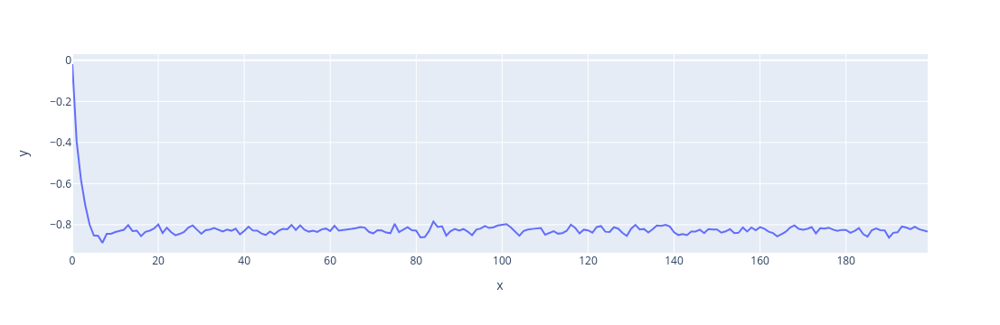

In [155]:
dx = np.array([r.x_hat[:,0] - r.truth[:,0] for r in results]).T.mean(axis=1)
ex.line(y=dx)

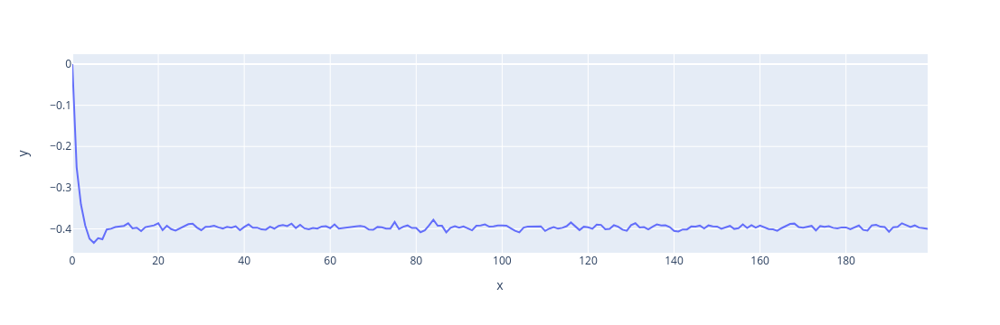

In [156]:
dy = np.array([r.x_hat[:,3] - r.truth[:,3] for r in results]).T.mean(axis=1)
ex.line(y=dy)

In [157]:
Kx = results[0].K[-1,0,0]
Kv = results[0].K[-1,3,0]
Kx, Kv

(0.6320850016101968, 0.30327998548775165)

In [162]:
# dx, dv
a/Kv, a * (Kx/Kv - .5)

(0.8243207991385787, 0.3960408136508272)

In [163]:
dx[100:].mean(), dy[100:].mean()

(-0.8268127585321465, -0.3961741960992803)

In [170]:
As = [.1, .2, .5, 1, 2]
trace = []

for a in As:
    results = monte_carlo(ConstantAccelerationTarget(a), ConstantVelocityModel(.5), 1, seeds=range(10000), n=600)
    Kx = results[0].K[-1,0,0]
    Kv = results[0].K[-1,3,0]

    dx = np.array([r.x_hat[:,0] - r.truth[:,0] for r in results]).T.mean(axis=1)
    dy = np.array([r.x_hat[:,3] - r.truth[:,3] for r in results]).T.mean(axis=1)
    
    trace.append((Kx, Kv, a/Kv, a * (Kx/Kv - .5), dx[100:].mean(), dy[100:].mean()))

In [171]:
to_df(np.array(trace))

,x0,x1,x2,x3,x4,x5
0,0.632085,0.30328,0.329728,0.158416,-0.329770,-0.158387
1,0.632085,0.30328,0.659457,0.316833,-0.659174,-0.316823
2,0.632085,0.30328,1.648642,0.792082,-1.648908,-0.792106
3,0.632085,0.30328,3.297283,1.584163,-3.297789,-1.584158
4,0.632085,0.30328,6.594566,3.168327,-6.594879,-3.168343


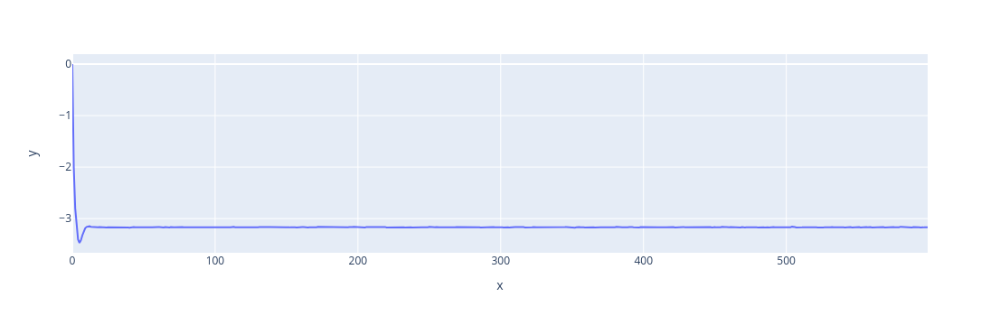

In [172]:
dy = np.array([r.x_hat[:,3] - r.truth[:,3] for r in results]).T.mean(axis=1)
ex.line(y=dy)